# Analytics Project: Network Analysis of Financial Security Settlement Network

## Introduction

This project is situated in the context of financial securities trading (stocks, bonds, derivatives), more specifically in the settlement of securities. The lifecycle of a trade (for example on the stock market) consists of different steps, such as pre-trade, trade execution, trade clearing, trade settlement and post-settlement activities. In the settlement phase, ownership of the security being traded is transferred between the two participants (financial institutions). 

Within the complex environment of the global financial markets, the Financial Market Infrastructure (FMI) provided by Euroclear Bank serves an essential role in ensuring the seamless execution, stability, and efficiency of cross-border financial transactions. As a leading International Central Securities Depository (ICSD), Euroclear Bank facilitates worldwide connectivity by offering post-trade services to counterparties across the world. It covers all sorts of asset types, including bonds, equities, funds and derivatives, with its services extending to over 1.7 million distinct securities. 
The Euroclear group holds €37.6 trillion in assets in custody for over 2000 clients worldwide. The operations process 295 million transactions per year cumulating in a value of €1 quadrillion. 

This project builds on the results of the master's thesis "Innovating Financial Settlement Processes through Advanced Simulation and Process Analytics."
in collaboration with Euroclear. In this research, a simulator of the settlement process was built in Python that requires (synthetic) data of the transactions and participants and subsequently runs the settlement process with those transactions. The simulator then generates output analytics such as the efficiency of the run (how much transaction value was able to settle), total credit used by the participants, total value of failed transactions because of shortage of funds on the accounts of the participants. The simulator also generates an event log, that we use for process mining to gain additional insights into the processes. This allows the user to analyze the impact of different parameter settings of the simulator and for example the effect of shocks in the process. Matters investigated in the thesis with the simulator are the impact on the outcomes of the process when the total cycle time (mandatory) is brought down and the impact of different settings on the efficiency of the process.

The goal of this project is to gain additional insight into the dependency of the different transactions and participants by conducting network analysis on the transaction dataset, participant dataset and the resulting event log. In addition to the pefromed research for our master's thesis, it would be interesting to conduct a network analysis on how transactions (edges) occur between participants (nodes) and whether certain tendencies emerge within the network. Given the highly regularised context, high volumes and importance of efficient functioning of financial markets, small improvements in the settlement process can bring great value. This makes research from the perspective of social networks an interesting additional dimension to identify possible additional improvements.

The following research questions will be investigated in this project:
- Who are the key participants in the settlement process, and which are the most central nodes influencing transaction flow?
- How does the settlement network evolve over the course of a processing day?
- Can community detection identify clusters within the settlement network, and which participants or transactions are preventing or enabling settlements?
- Is there a correlation between the centrality of a participant and their settlement efficiency?
- How stable is the settlement network when the most important nodes are removed?



## Data and Methodology

The data is obtained through the simulator system of the research thesis. This requires a synthetic transaction dataset and participant transaction dataset created with the data generator. This input data is fed to the simulator so that the settlement process can be simulated. The result of the simulator is an event log that contains all the steps of the settlement process for each case. The exact content, structure and required preprocessing steps of the data will be shown in detail in the further sections of this report.

Since the input data is an event log, where the network consisting of participants (nodes) sending transactions to each other (edges) changes over time, a temporal network analysis approach was adopted. More specifically, for the analysis of the network, the network is made every 15 minutes and the result is saved to generate a video as an output to reflect the network dynamics and key findings. Several simulations were visualised in this way. 

Community detection is applied in the second part on the end state of the cummulative network. This is first analysed to represent the key characteristics and then used to apply different community detection algorithms to it. 


## Results

+ Define the structure of the results section

In [ ]:
!pip install python-igraph
!pip install matplotlib
!pip install numpy
!pip install scipy
!pip install easygui
!pip install cairocffi
!pip install pm4py

In [1]:
import igraph as ig
import easygui
from matplotlib import pyplot as plt
import numpy as np
import scipy
import statistics
import pandas as pd
import pm4py
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
from IPython.display import Image, display
import os
from IPython.display import Video
import pandas as pd
from igraph import Graph, plot
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
from concurrent.futures import ThreadPoolExecutor
from PIL import Image as PILImage
import time
import re
import pandas as pd
from igraph import Graph, plot
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from IPython.display import Image as IPImage, display

# Transaction Data

We import the transaction data. The dataset contains instructions for executing security transactions. Each transaction includes two instructions: a cash lag and a security lag, reflecting the exchange of cash and securities between participants. By excluding transactions involving Account ID 0, we focus solely on the security instructions, which reveal which participants are purchasing securities from others.

In [2]:
# Load data from CSV
transactions = pd.read_csv('.\DATA\TRANSACTION1.csv', sep=';')
print(transactions.head())
securities_transactions = transactions[(transactions['FromAccountId'] != 0) | (transactions['ToAccountId'] != 0)].copy()

   TID                 Time         Value  FromParticipantId  FromAccountId  \
0    1  2024-03-02 00:00:14  6.642740e+07                 74              4   
1    2  2024-03-02 00:00:19  4.535360e+07                 82              0   
2    3  2024-03-02 00:00:21  1.350978e+08                 12              3   
3    4  2024-03-02 00:00:33  2.285393e+07                 84              0   
4    5  2024-03-02 00:00:46  1.455548e+08                 49              0   

   ToParticipantId  ToAccountId  Linkcode SettlementDeadline  T+x  
0               10            4       845         2024-03-02    0  
1               81            0      4310         2024-03-02    0  
2               93            3      2155         2024-03-02    0  
3               99            0      2722         2024-03-02    0  
4               11            0     13867         2024-03-02    0  


<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\toont\AppData\Local\Temp\ipykernel_6264\4127573787.py:2: SyntaxWarning: invalid escape sequence '\D'
  transactions = pd.read_csv('.\DATA\TRANSACTION1.csv', sep=';')


# Network Graph: Each Edge Represents a Single Settled Transaction

Next, the event log, which is the output of the simulation, is read in and merged with the transaction dataset using transaction IDs. This process enriches the event log with detailed information about each transaction related to the activities in the log. The log can then be filtered by criteria such as activity or time to extract specific insights. We filter the transaction on the settling activity, so that we only keep the successfully executed transactions.

In [3]:
eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')
print("eventlog: ", eventlog.head())
#join transactions with event log
merged_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df = merged_df[merged_df['Activity'] == "Settling"].copy()
print("dataframe: ",df.head())

eventlog:     TID            Starttime              Endtime                      Activity
0    1  2024-03-02 00:00:14  2024-03-02 00:00:15                    Validating
1    1  2024-03-02 00:00:15  2024-03-02 00:00:15  Waiting in backlog unmatched
2    2  2024-03-02 00:00:19  2024-03-02 00:00:20                    Validating
3    2  2024-03-02 00:00:20  2024-03-02 00:00:20  Waiting in backlog unmatched
4    3  2024-03-02 00:00:21  2024-03-02 00:00:22                    Validating
dataframe:       TID            Starttime              Endtime  Activity  \
479  171  2024-03-02 01:30:01  2024-03-02 01:30:01  Settling   
480  201  2024-03-02 01:30:01  2024-03-02 01:30:01  Settling   
481   19  2024-03-02 01:30:01  2024-03-02 01:30:01  Settling   
482  308  2024-03-02 01:30:01  2024-03-02 01:30:01  Settling   
483  302  2024-03-02 01:30:01  2024-03-02 01:30:01  Settling   

                    Time        Value  FromParticipantId  FromAccountId  \
479  2024-03-02 00:32:26  89117458.22      

<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\toont\AppData\Local\Temp\ipykernel_6264\3054634150.py:1: SyntaxWarning: invalid escape sequence '\D'
  eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')


We print out the in and out-degree for each participant and plot the network, each edge represents one transaction.

In [4]:
# Extract unique participant IDs
from_participants = df['FromParticipantId'].unique()
to_participants = df['ToParticipantId'].unique()
all_participants = np.unique(np.concatenate((from_participants, to_participants)))

# Create a graph with participants as nodes
g = Graph(directed=True)
g.add_vertices(all_participants.astype(str))

# Add edges for each transaction
for _, row in df.iterrows():
    g.add_edge(str(row['FromParticipantId']), str(row['ToParticipantId']))

# Calculate in-degree and out-degree for each participant
in_degree = g.indegree()
out_degree = g.outdegree()

# Print results
for v in g.vs:
    print(f"Participant {v['name']} - In-degree: {in_degree[v.index]}, Out-degree: {out_degree[v.index]}")

# Visualize the graph
layout = g.layout('kk')  # Kamada-Kawai layout
visual_style = {
    "vertex_size": 20,
    "vertex_label": g.vs['name'],
    "edge_width": [1 for _ in g.es],  # Uniform edge width as weights are not considered
    "layout": layout,
    "bbox": (750, 750),
    "margin": 10
}
plot(g, **visual_style)


Participant 1 - In-degree: 120, Out-degree: 122
Participant 2 - In-degree: 52, Out-degree: 0
Participant 3 - In-degree: 143, Out-degree: 134
Participant 4 - In-degree: 124, Out-degree: 124
Participant 5 - In-degree: 147, Out-degree: 108
Participant 6 - In-degree: 121, Out-degree: 118
Participant 7 - In-degree: 140, Out-degree: 160
Participant 8 - In-degree: 125, Out-degree: 135
Participant 9 - In-degree: 41, Out-degree: 0
Participant 10 - In-degree: 90, Out-degree: 140
Participant 11 - In-degree: 95, Out-degree: 102
Participant 12 - In-degree: 84, Out-degree: 115
Participant 13 - In-degree: 143, Out-degree: 125
Participant 14 - In-degree: 141, Out-degree: 148
Participant 15 - In-degree: 154, Out-degree: 136
Participant 16 - In-degree: 129, Out-degree: 147
Participant 17 - In-degree: 152, Out-degree: 130
Participant 18 - In-degree: 0, Out-degree: 141
Participant 19 - In-degree: 153, Out-degree: 141
Participant 20 - In-degree: 138, Out-degree: 127
Participant 21 - In-degree: 130, Out-deg

The network graph represents transactions where each edge is a single transaction between 2 nodes, more specifically between 2 financial institutions. Due to the high volume of transactions, individual edges may be difficult to distinguish. Therefore, it is recommended to aggregate transaction values and assign these sums as weights to the edges. Despite the current visualization challenges, it is already possible to observe five clusters within the network, with several central nodes. This clustering suggests underlying patterns within the transaction data which is interesting to investigate further.

# Generate video

Helper function to generate MP4 video from frames saved in a directory.

In [5]:
def generate_video(directory,title,png_counter = 97,time_between_images = 600):

    # Function to load an image
    def load_image(file_path):
        return np.array(PILImage.open(file_path))

    # Get all PNG files in the directory starting from graph_1.png
    image_files = [f"./{directory}/graph_{i}.png" for i in range(1, png_counter)]

    # Sort image files numerically
    def sort_numerically(file_list):
        return sorted(file_list, key=lambda x: int(re.findall(r'\d+', x)[0]), reverse=False) # reverse order

    sorted_image_files = sort_numerically(image_files)

    # Measure time for loading images
    start_time = time.time()
    with ThreadPoolExecutor() as executor:
        images = list(executor.map(load_image, sorted_image_files))
    load_time = time.time() - start_time
    print(f"Time to load {png_counter-1} images: {load_time:.2f} seconds")

    # Set up a Full HD resolution figure
    fig, ax = plt.subplots(figsize=(19.2, 10.8), dpi=300)  # 19.2 inches * 100 dpi = 1920 pixels, 10.8 inches * 100 dpi = 1080 pixels
    ax.axis('off')

    # Display the first image initially
    im = ax.imshow(images[0])

    def update(i):
        im.set_array(images[i])
        return [im]

    # Measure time for creating animation
    start_time = time.time()
    ani = FuncAnimation(fig, update, frames=len(images), interval=time_between_images, blit=True)
    create_time = time.time() - start_time
    print(f"Time to create animation: {create_time:.2f} seconds")

    # Measure time for saving animation with Full HD settings
    start_time = time.time()
    ani.save(f'{title}.mp4', writer='ffmpeg', dpi=300, extra_args=['-vcodec', 'libx264', '-preset', 'ultrafast', '-crf', '18'])
    save_time = time.time() - start_time
    print(f"Time to save animation: {save_time:.2f} seconds")

    print(f"Video has been created and saved as '{title}.mp4'.")

    plt.close(fig)



# NetworkGraph class

The main network class used for the analysis. This notebook makes extensive use of object-oriented programming to maintain organized and manageable code.

In [10]:
class NetworkGraph:
    def __init__(self, dataframe, directory, node_legend, edge_legend, title, timeframe = 15, start_day = pd.to_datetime('2024-03-02 00:00:00'), end_day = pd.to_datetime('2024-03-02 23:59:59')):
        self.df = dataframe.copy()
        self.start_day = start_day
        self.end_day = end_day
        self.timeframe = timeframe
        self.custom_cmap = self.create_custom_colormap()
        self.all_participants = self.extract_unique_participants()
        self.fixed_layout = self.precompute_layout()
        self.png_counter = 1
        self.directory = directory
        self.node_legend = node_legend
        self.edge_legend = edge_legend
        self.title= title

    def create_custom_colormap(self):
        colors = ["#00FF00", "#FFFF00", "#FF0000"]
        return mcolors.LinearSegmentedColormap.from_list("custom_heatmap", colors)

    def extract_unique_participants(self):
        minute_df = self.filter_dataframe(self.start_day, self.end_day)
        from_participants = minute_df['FromParticipantId'].astype(int).astype(str).unique()
        to_participants = minute_df['ToParticipantId'].astype(int).astype(str).unique()
        return np.unique(np.concatenate((from_participants, to_participants)))

    def precompute_layout(self):
        g_all = Graph(directed=True)
        g_all.add_vertices(self.all_participants)
        transaction_sums = self.calculate_transaction_sums(self.filter_dataframe(self.start_day, self.end_day))
        self.add_edges_to_graph(g_all, transaction_sums)
        return g_all.layout('kk')

    def filter_dataframe(self, start_time, end_time):
        self.df['Starttime'] = pd.to_datetime(self.df['Starttime'])
        filtered_df = self.df[(self.df['Starttime'] >= start_time) & (self.df['Starttime'] <= end_time)].copy()
        filtered_df['FromParticipantId'] = filtered_df['FromParticipantId'].astype(int).astype(str)
        filtered_df['ToParticipantId'] = filtered_df['ToParticipantId'].astype(int).astype(str)
        return filtered_df

    def calculate_transaction_sums(self, minute_df):
        return minute_df.pivot_table(index=['FromParticipantId', 'ToParticipantId'], values='Value', aggfunc='sum').reset_index()

    def add_edges_to_graph(self, graph, transaction_sums):
        for _, row in transaction_sums.iterrows():
            from_id = str(row['FromParticipantId'])
            to_id = str(row['ToParticipantId'])
            if row['Value'] != 0:
                graph.add_edge(from_id, to_id, weight=row['Value'])

    def normalize_weights(self, weights):
        if len(weights) > 1:
            min_weight = weights.min()
            max_weight = weights.max()
            return 100 * (weights - min_weight) / (max_weight - min_weight)
        else:
            return np.array([50])

    def get_node_colors(self, g):
        betweenness = g.betweenness()
        in_degrees = g.indegree()
        out_degrees = g.outdegree()

        max_betweenness = np.max(betweenness)
        max_in_degree = np.max(in_degrees)
        max_out_degree = np.max(out_degrees)

        max_betweenness_nodes = [v['name'] for v, b in zip(g.vs, betweenness) if b == max_betweenness]
        max_in_degree_nodes = [v['name'] for v, d in zip(g.vs, in_degrees) if d == max_in_degree]
        max_out_degree_nodes = [v['name'] for v, d in zip(g.vs, out_degrees) if d == max_out_degree]

        node_final_colors = {v['name']: "grey" for v in g.vs}

        for node in max_betweenness_nodes:
            if node in max_in_degree_nodes and node in max_out_degree_nodes:
                node_final_colors[node] = "pink"
            elif node in max_in_degree_nodes:
                node_final_colors[node] = "orange"
            elif node in max_out_degree_nodes:
                node_final_colors[node] = "purple"
            else:
                node_final_colors[node] = "red"

        for node in max_in_degree_nodes:
            if node in max_out_degree_nodes and node_final_colors[node] == "grey":
                node_final_colors[node] = "cyan"
            elif node_final_colors[node] == "grey":
                node_final_colors[node] = "blue"

        for node in max_out_degree_nodes:
            if node_final_colors[node] == "grey":
                node_final_colors[node] = "green"

        return [node_final_colors[v['name']] for v in g.vs]

    def save_plot(self, g, target, **visual_style):
        fig, ax = plt.subplots(figsize=(19.2, 10.8), dpi=300)
        plot(g, target=target, **visual_style)
        plt.close(fig)

    def add_title_and_legend(self, file_name, current_time, next_time, visible=True):
        if visible == True:
            image = PILImage.open(file_name)
            draw = ImageDraw.Draw(image)
            title_text = f"{self.title} network graph at {current_time.strftime('%Y-%m-%d %H:%M:%S')} - {next_time.strftime('%Y-%m-%d %H:%M:%S')}"
            font = ImageFont.truetype("arial.ttf", 12)
            text_bbox = draw.textbbox((0, 0), title_text, font=font)
            text_width = text_bbox[2] - text_bbox[0]
            text_position = ((image.width - text_width) // 2, 10)
            draw.text(text_position, title_text, font=font, fill="black")

            legend_items_upper = [
                ("Highest Betweenness", "red"),
                ("Highest In-Degree", "blue"),
                ("Highest Out-Degree", "lightgreen"),
                ("Highest In-Degree & Out-Degree", "cyan"),
                ("Highest Betweenness & Out-Degree", "purple"),
                ("Highest Betweenness & In-Degree", "orange"),
                ("Highest Betweenness & In-Degree & Out-Degree", "pink")
            ]
            if self.node_legend == "top":
                legend_font = ImageFont.truetype("arial.ttf", 14)
                legend_x = 50
                legend_y = 50
                legend_box_size = 20
                draw.text((legend_x, legend_y - 30), "Node Metrics", font=legend_font, fill="black")
                for text, color in legend_items_upper:
                    draw.rectangle([legend_x, legend_y, legend_x + legend_box_size, legend_y + legend_box_size], fill=color)
                    draw.text((legend_x + legend_box_size + 10, legend_y), text, font=legend_font, fill="black")
                    legend_y += legend_box_size + 10
            elif self.node_legend == "bottom":
                legend_font = ImageFont.truetype("arial.ttf", 14)  # Smaller font size
                legend_box_size = 20  # Smaller box size
                total_legend_height = (legend_box_size + 10) * len(legend_items_upper) + 30
                legend_x = 50
                legend_y = image.height - total_legend_height - 50
                draw.text((legend_x, legend_y - 30), "Node Metrics", font=legend_font, fill="black")  # Legend title
                for text, color in legend_items_upper:
                    draw.rectangle([legend_x, legend_y, legend_x + legend_box_size, legend_y + legend_box_size], fill=color)
                    draw.text((legend_x + legend_box_size + 10, legend_y), text, font=legend_font, fill="black")
                    legend_y += legend_box_size + 10

            edge_legend_items = [
                ("Weight 0-10", mcolors.to_hex(self.custom_cmap(0.1))),
                ("Weight 10-20", mcolors.to_hex(self.custom_cmap(0.2))),
                ("Weight 20-30", mcolors.to_hex(self.custom_cmap(0.3))),
                ("Weight 30-40", mcolors.to_hex(self.custom_cmap(0.4))),
                ("Weight 40-50", mcolors.to_hex(self.custom_cmap(0.5))),
                ("Weight 50-60", mcolors.to_hex(self.custom_cmap(0.6))),
                ("Weight 60-70", mcolors.to_hex(self.custom_cmap(0.7))),
                ("Weight 70-80", mcolors.to_hex(self.custom_cmap(0.8))),
                ("Weight 80-90", mcolors.to_hex(self.custom_cmap(0.9))),
                ("Weight 90-100", mcolors.to_hex(self.custom_cmap(1.0)))
            ]

            if self.edge_legend == "top":
                legend_x = image.width - 300
                legend_y = 50
                draw.text((legend_x, legend_y - 30), "Edge Weight Range", font=ImageFont.truetype("arial.ttf", 14), fill="black")
                for text, color in edge_legend_items:
                    draw.rectangle([legend_x, legend_y, legend_x + legend_box_size, legend_y + legend_box_size], fill=color)
                    draw.text((legend_x + legend_box_size + 10, legend_y), text, font=ImageFont.truetype("arial.ttf", 14), fill="black")
                    legend_y += legend_box_size + 10
            elif self.edge_legend == "bottom":
                # Draw edge legend in the bottom right corner
                legend_font_size = 14  # Smaller font size
                legend_box_size = 20  # Smaller box size
                total_edge_legend_height = (legend_box_size + 10) * len(edge_legend_items) + 30
                legend_x = image.width - 275
                legend_y = image.height - total_edge_legend_height - 20
                draw.text((legend_x, legend_y - 30), "Edge Weight Range", font=ImageFont.truetype("arial.ttf", legend_font_size), fill="black")  # Legend title
                for text, color in edge_legend_items:
                    draw.rectangle([legend_x, legend_y, legend_x + legend_box_size, legend_y + legend_box_size], fill=color)
                    draw.text((legend_x + legend_box_size + 10, legend_y), text, font=ImageFont.truetype("arial.ttf", legend_font_size), fill="black")
                    legend_y += legend_box_size + 10  # Adjust the spacing between items

            image.save(file_name)

    def create_graphs_non_cumulative(self):
        current_time = self.start_day
        while current_time <= self.end_day:
            next_time = current_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
            minute_df = self.filter_dataframe(current_time, next_time)

            g = Graph(directed=True)
            g.add_vertices(self.all_participants)
            g.vs['name'] = self.all_participants

            if not minute_df.empty:
                transaction_sums = self.calculate_transaction_sums(minute_df)
                self.add_edges_to_graph(g, transaction_sums)
                weights = np.array(g.es["weight"])
                normalized_weights = self.normalize_weights(weights)
                norm = mcolors.Normalize(vmin=0, vmax=100)
                edge_colors_by_weight = [mcolors.to_hex(self.custom_cmap(norm(weight))) for weight in normalized_weights]
                node_colors = self.get_node_colors(g)
            else:
                node_colors = ["grey"] * len(g.vs)
                normalized_weights = []
                edge_colors_by_weight = []

            visual_style = {
                "vertex_size": 20,
                "vertex_label": g.vs['name'],
                "layout": self.fixed_layout,
                "bbox": (1920, 1080),
                "margin": 110,
                "vertex_color": node_colors
            }
            if len(normalized_weights) > 0:
                visual_style["edge_width"] = normalized_weights / 10
                visual_style["edge_color"] = edge_colors_by_weight

            file_name = f"{self.directory}/graph_{self.png_counter}.png"
            self.save_plot(g, target=file_name, **visual_style)
            self.add_title_and_legend(file_name, current_time, next_time)
            current_time += pd.Timedelta(minutes=self.timeframe)
            self.png_counter += 1

    def create_graphs_cumulative(self):
        current_time = self.start_day
        next_time = current_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
        while next_time <= self.end_day:
            
            minute_df = self.filter_dataframe(current_time, next_time)

            g = Graph(directed=True)
            g.add_vertices(self.all_participants)
            g.vs['name'] = self.all_participants

            if not minute_df.empty:
                transaction_sums = self.calculate_transaction_sums(minute_df)
                self.add_edges_to_graph(g, transaction_sums)
                weights = np.array(g.es["weight"])
                normalized_weights = self.normalize_weights(weights)
                norm = mcolors.Normalize(vmin=0, vmax=100)
                edge_colors_by_weight = [mcolors.to_hex(self.custom_cmap(norm(weight))) for weight in normalized_weights]
                node_colors = self.get_node_colors(g)
            else:
                node_colors = ["grey"] * len(g.vs)
                normalized_weights = []
                edge_colors_by_weight = []

            visual_style = {
                "vertex_size": 20,
                "vertex_label": g.vs['name'],
                "layout": self.fixed_layout,
                "bbox": (1920, 1080),
                "margin": 110,
                "vertex_color": node_colors
            }
            if len(normalized_weights) > 0:
                visual_style["edge_width"] = normalized_weights / 10
                visual_style["edge_color"] = edge_colors_by_weight

            file_name = f"{self.directory}/graph_{self.png_counter}.png"
            self.save_plot(g, target=file_name, **visual_style)
            self.add_title_and_legend(file_name, current_time, next_time)

            next_time = next_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
            self.png_counter += 1
    
    def create_final_image_cumulative(self):
        current_time = self.start_day
        next_time = self.end_day
          
        minute_df = self.filter_dataframe(current_time, next_time)

        g = Graph(directed=True)
        g.add_vertices(self.all_participants)
        g.vs['name'] = self.all_participants

        if not minute_df.empty:
            transaction_sums = self.calculate_transaction_sums(minute_df)
            self.add_edges_to_graph(g, transaction_sums)
            weights = np.array(g.es["weight"])
            normalized_weights = self.normalize_weights(weights)
            norm = mcolors.Normalize(vmin=0, vmax=100)
            edge_colors_by_weight = [mcolors.to_hex(self.custom_cmap(norm(weight))) for weight in normalized_weights]
            node_colors = self.get_node_colors(g)
        else:
            node_colors = ["grey"] * len(g.vs)
            normalized_weights = []
            edge_colors_by_weight = []

        visual_style = {
            "vertex_size": 20,
            "vertex_label": g.vs['name'],
            "layout": self.fixed_layout,
            "bbox": (1920, 1080),
            "margin": 110,
            "vertex_color": node_colors
        }
        if len(normalized_weights) > 0:
            visual_style["edge_width"] = normalized_weights / 10
            visual_style["edge_color"] = edge_colors_by_weight

        file_name = f"{self.directory}/graph.png"
        self.save_plot(g, target=file_name, **visual_style)
        self.add_title_and_legend(file_name, current_time, next_time)

        display(IPImage(filename=file_name))

    def degree_cumulative(self):
        self.png_counter = 1

        # Calculate top 20 degree nodes using the entire dataset
        entire_period_df = self.filter_dataframe(self.start_day, self.end_day)
        entire_g = Graph(directed=True)
        entire_g.add_vertices(self.all_participants)
        entire_g.vs['name'] = self.all_participants

        if not entire_period_df.empty:
            transaction_sums = self.calculate_transaction_sums(entire_period_df)
            self.add_edges_to_graph(entire_g, transaction_sums)

        degree_dict_entire = {int(participant): entire_g.degree(participant, mode="all") for participant in self.all_participants}
        top_20_participants = sorted(degree_dict_entire, key=degree_dict_entire.get, reverse=True)[:20]

        current_time = self.start_day
        next_time = current_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
        while next_time <= self.end_day:

            minute_df = self.filter_dataframe(current_time, next_time)

            g = Graph(directed=True)
            g.add_vertices(self.all_participants)
            g.vs['name'] = self.all_participants

            if not minute_df.empty:
                transaction_sums = self.calculate_transaction_sums(minute_df)
                self.add_edges_to_graph(g, transaction_sums)

            degree_dict = {int(participant): {"in_degree": 0, "out_degree": 0} for participant in self.all_participants}

            for participant in self.all_participants:
                participant_id = int(participant)
                degree_dict[participant_id]["in_degree"] = g.indegree(vertices=participant)
                degree_dict[participant_id]["out_degree"] = g.outdegree(vertices=participant)

            # Filter only top 20 participants
            top_20_in_degrees = [degree_dict[participant]["in_degree"] for participant in top_20_participants]
            top_20_out_degrees = [degree_dict[participant]["out_degree"] for participant in top_20_participants]

            # Sort the top 20 participants based on their node number
            sorted_top_20_participants = sorted(top_20_participants)

            # Reorder in_degrees and out_degrees based on sorted participants
            sorted_top_20_in_degrees = [degree_dict[participant]["in_degree"] for participant in sorted_top_20_participants]
            sorted_top_20_out_degrees = [degree_dict[participant]["out_degree"] for participant in sorted_top_20_participants]

            # Set the width of the bars
            bar_width = 0.35

            # Set the x locations for the groups
            x = np.arange(len(sorted_top_20_participants))

            fig, ax = plt.subplots(figsize=(10, 6))

            # Plotting
            ax.bar(x - bar_width/2, sorted_top_20_in_degrees, width=bar_width, color='blue', label='In Degree')
            ax.bar(x + bar_width/2, sorted_top_20_out_degrees, width=bar_width, color='green', alpha=0.5, label='Out Degree')
            ax.set_xlabel('Participant')
            ax.set_ylabel('Degree')
            ax.set_title(f"In and Out Degrees of Top 20 Participants {current_time.strftime('%Y-%m-%d %H:%M:%S')} - {next_time.strftime('%Y-%m-%d %H:%M:%S')}")
            ax.legend()
            ax.set_xticks(ticks=x)
            ax.set_xticklabels(sorted_top_20_participants, rotation=45, ha='right')
            plt.tight_layout()

            # Add labels to each bar
            for i, (in_degree, out_degree) in enumerate(zip(sorted_top_20_in_degrees, sorted_top_20_out_degrees)):
                ax.text(x[i] - bar_width/2, in_degree + 0.05, str(round(in_degree, 2)), ha='center', va='bottom')
                ax.text(x[i] + bar_width/2, out_degree + 0.05, str(round(out_degree, 2)), ha='center', va='bottom')

            file_name = f"{self.directory}/graph_{self.png_counter}.png"
            plt.savefig(file_name)
            plt.close(fig)  # Close the figure to prevent it from being displayed

            # Move to the next minute
            next_time = next_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
            self.png_counter += 1

    def betweenness_cumulative(self):
        self.png_counter = 1

        # Calculate top 20 betweenness nodes using the entire dataset
        entire_period_df = self.filter_dataframe(self.start_day, self.end_day)
        entire_g = Graph(directed=True)
        entire_g.add_vertices(self.all_participants)
        entire_g.vs['name'] = self.all_participants

        if not entire_period_df.empty:
            transaction_sums = self.calculate_transaction_sums(entire_period_df)
            self.add_edges_to_graph(entire_g, transaction_sums)

        betweenness_dict_entire = {int(participant): entire_g.betweenness(participant) for participant in self.all_participants}
        top_20_participants = sorted(betweenness_dict_entire, key=betweenness_dict_entire.get, reverse=True)[:20]

        current_time = self.start_day
        next_time = current_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
        while next_time <= self.end_day:

            minute_df = self.filter_dataframe(current_time, next_time)

            g = Graph(directed=True)
            g.add_vertices(self.all_participants)
            g.vs['name'] = self.all_participants

            if not minute_df.empty:
                transaction_sums = self.calculate_transaction_sums(minute_df)
                self.add_edges_to_graph(g, transaction_sums)

            betweenness_dict = {int(participant): 0 for participant in self.all_participants}

            for participant in self.all_participants:
                participant_id = int(participant)
                betweenness_dict[participant_id] = g.betweenness(vertices=participant)

            # Filter only top 20 participants
            top_20_betweenness = [betweenness_dict[participant] for participant in top_20_participants]

            # Sort the top 20 participants based on their node number
            sorted_top_20_participants = sorted(top_20_participants)

            # Reorder betweenness based on sorted participants
            sorted_top_20_betweenness = [betweenness_dict[participant] for participant in sorted_top_20_participants]

            # Set the width of the bars
            bar_width = 0.35

            # Set the x locations for the groups
            x = np.arange(len(sorted_top_20_participants))

            fig, ax = plt.subplots(figsize=(10, 6))

            # Plotting
            ax.bar(x, sorted_top_20_betweenness, width=bar_width, color='purple', label='Betweenness')
            ax.set_xlabel('Participant')
            ax.set_ylabel('Betweenness')
            ax.set_title(f"Betweenness of Top 20 Participants {current_time.strftime('%Y-%m-%d %H:%M:%S')} - {next_time.strftime('%Y-%m-%d %H:%M:%S')}")
            ax.legend()
            ax.set_xticks(ticks=x)
            ax.set_xticklabels(sorted_top_20_participants, rotation=45, ha='right')
            plt.tight_layout()

            # Add labels to each bar
            for i, betweenness in enumerate(sorted_top_20_betweenness):
                ax.text(x[i], betweenness + 0.05, str(round(betweenness, 2)), ha='center', va='bottom')

            file_name = f"{self.directory}/graph_{self.png_counter}.png"
            plt.savefig(file_name)
            plt.close(fig)  # Close the figure to prevent it from being displayed

            # Move to the next minute
            next_time = next_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
            self.png_counter += 1


In [ ]:
directory = "betweenness" # Directory to save frames
title = "betweenness" # Title of the frames
videoname = "betweenness"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.betweenness_cumulative() # Create the network and save the frames

# Network Graph: Each Edge Represents the Total Value of Transactions Between Nodes



In this section, we conduct a temporal graph analysis of the security settlement network by capturing the network's state every 15 minutes. Each participant (financial institution) is represented by a node, and each security transaction between two participants is represented by a directed, weighted edge. The weights of the edges are based on the normalized value exchanged within the timeframe.

The visualizations can be either cumulative or non-cumulative. In the cumulative approach, the timeframe extends from the start of the day, summing the total value exchanged up to each point. In the non-cumulative approach, the network is visualized in discrete 15-minute intervals.

Edges are colored according to a heatmap based on their weights, and nodes with the highest betweenness centrality or the highest in-degree and out-degree are highlighted in a different color.

The Kamada-Kawai force-directed algorithm is used to decide on the layout of the network. To determine the layout, the final state of the network is first taken and recorded so that the position of the nodes does not change throughout the sequence of frames.

## Base Case: Settled Transactions

### Data Processing

We merge the transaction data (imported ealier) with the eventlog to obtain the correct data used for the base case. We filter on the activity "Settling", this way we only keep the successfully executed transactions.

In [4]:
#read in eventlog
eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')
#join transactions with event log
network_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df = network_df[network_df['Activity'] == "Settling"].copy()

### Non-Cumulative Network Analysis Over Time

We generate a video where each frame represents the aggregated transaction values over 15-minute intervals.

In [13]:
directory = "Base_case_non_cumulative_video" # Directory to save frames
title = "Non-Cumulative - Settled Transactions" # Title of the frames
videoname = "Non-Cumulative-SettledTransactions"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.create_graphs_non_cumulative() # Create the network and save the frames

In [119]:
generate_video(directory, videoname)

Time to load 96 images: 0.56 seconds
Time to create animation: 0.77 seconds
Time to save animation: 151.96 seconds
Video has been created and saved as 'graph_animation.mp4'.


In [ ]:
Video(f'{videoname}.mp4', embed=True, width=1920, height=1080)

This visualization approach shows the transactions within a 15 min time interval, without accumulating past data, which results in a chaotic and rapid changing network graph. It changes too quickly and randomly, making it difficult to track and understand the flow of transactions. To improve the clarity and usefulness of the visualization, we will focus on the cumulative visualization. 

### Cumulative Network Analysis Over Time

In [120]:
directory = "Base_case__cumulative_video" # Directory to save frames
title = "Cumulative - Settled Transactions" # Title of the frames
videoname = "Cumulative-SettledTransactions"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.create_graphs_cumulative() # Create the network and save the frames

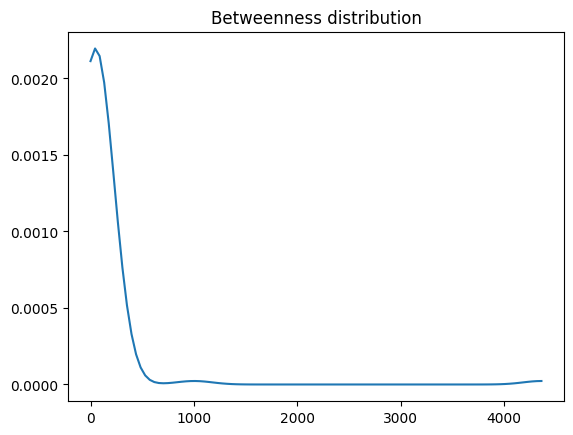

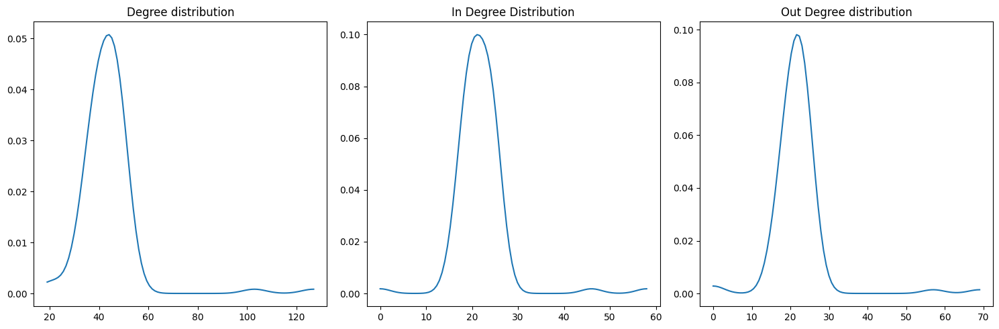

Top 3 nodes by degree: ['35', '79', '92'] (Degrees: [127, 103, 54])
Top 3 nodes by betweenness: ['35', '79', '92'] (Betweenness: [4360.540100698159, 1002.2863795234779, 112.45574690697588])
Top 3 nodes by Clustering Coefficient: ['18', '26', '5'] (Betweenness: [1.0, 1.0, 1.0])


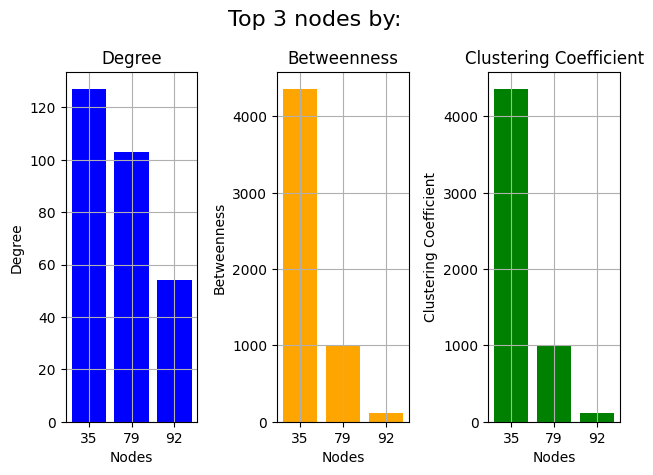

In [16]:
network_graph.create_graph_for_analysis()

In [121]:
generate_video(directory, videoname)

Time to load 96 images: 0.73 seconds
Time to create animation: 0.79 seconds
Time to save animation: 154.34 seconds
Video has been created and saved as 'graph_animation.mp4'.


In [17]:
directory = "betweenness_base_case" # Directory to save frames
title = "betweenness" # Title of the frames
videoname = "betweenness"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.betweenness_cumulative() # Create the network and save the frames

In [ ]:
generate_video(directory, videoname)

In [ ]:
Video(f'{videoname}.mp4', embed=True, width=1920, height=1080)

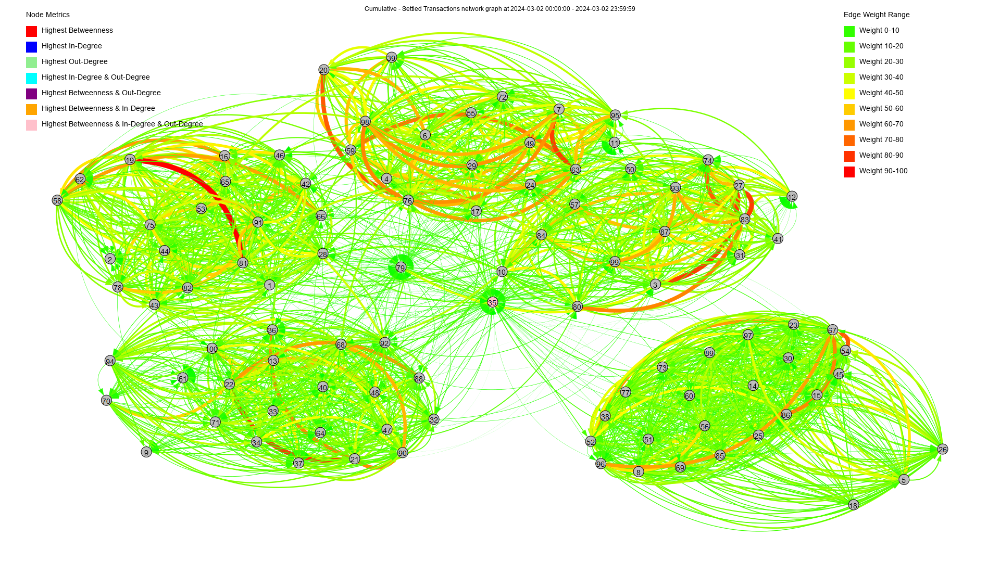

In [145]:
network_graph.create_final_image_cumulative()

This cumulative approach, where transaction values are aggregated over time, provides a clearer picture of the network's evolution and the relationship between different nodes. Throughout the course of the day, as depicted in the video, it is possible to observe that the network expands with each additional transaction executed. This dynamic representation allows us to witness the growth and the increasing complexity of the network, illustrating how financial relationships develop and strengthen over time. 

Within this visiualization, we can identify five primary clusters. Remarkable is that node 35 en 79 have a central role in the network. Node 35, in particular, is crucial due to its high betweenness centrality and high in-degree and out-degree values, making it act as a hub to connect the network's flow transactions. 

The cluster located in the bottom right corner appears to be uniquely connected to the rest of the network primarily through node 35. This suggests that this cluster might represent an exotic market isolated from the of the financial system. In contrast, the other four clusters are more interconnected, showing a more dense network of transactions.

TO BE CHECKED: Within these clusters, certain nodes stand out as intra-cluster hubs, such as nodes 18, 5 and 26 in the exotic market cluster. These hubs improve the flow of transactions within their respecitve cluser.

## Base Case: Failed Transactions

### Data Processing

We extract the failed transactions by taking the submitted transactions (validated transactions) for the day and removing the successfully executed transactions. The remaining transactions are the failed ones.

In [18]:
#read in eventlog
eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')
#join transactions with event log
network_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df_settling = network_df[network_df['Activity'] == "Settling"].copy()
df_validating = network_df[network_df['Activity'] == "Validating"].copy()

df_failed = df_validating[~df_validating['TID'].isin(df_settling['TID'])]


<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\toont\AppData\Local\Temp\ipykernel_6264\883715372.py:2: SyntaxWarning: invalid escape sequence '\D'
  eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')


In [19]:
## check if failed + settled = validating
# Concatenate df and df_settling
concatenated_df = pd.concat([df_failed, df_settling])

# Keep only the TID column and sort the DataFrames for comparison
concatenated_df_sorted = concatenated_df[['TID']].sort_values(by='TID').reset_index(drop=True)
df_validating_sorted = df_validating[['TID']].sort_values(by='TID').reset_index(drop=True)

# Check if the concatenated DataFrame is equal to df_validating
if concatenated_df_sorted.equals(df_validating_sorted):
    print("Settled transactions + failed transactions is equal to the transactions that validated (all transactions submitted for the day)")
else:
    print("Error: Settled transactions + failed transactions is not equal to the transactions that validated (all transactions submitted for the day)")

Settled transactions + failed transactions is equal to the transactions that validated (all transactions submitted for the day)


Among the failed transactions, we filter for the activity "Waiting in backlog for recycling," which indicates the moment when the transaction was unable to execute and was placed in the backlog.

In [20]:
df = network_df[
    (network_df['TID'].isin(df_failed['TID'])) & 
    (network_df['Activity'] == "Waiting in backlog for recycling")
]


### Cumulative Network Analysis Over Time

In [21]:
# Runtime +-30s
directory = "Base_case_failed_transactions"
title = "Cumulative - Failed Transactions"
videoname = "Cumulative-FailedTransactions"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.create_graphs_cumulative() # Create the network and save the frames

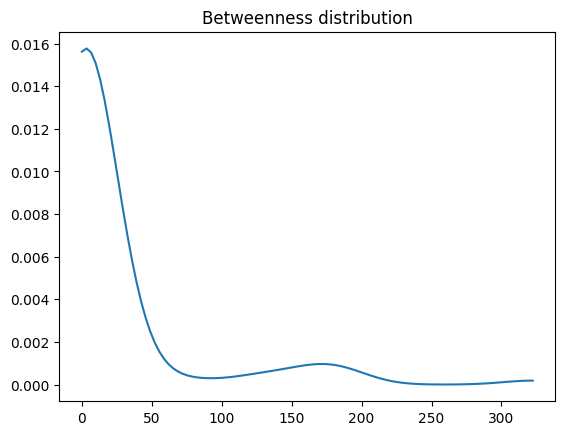

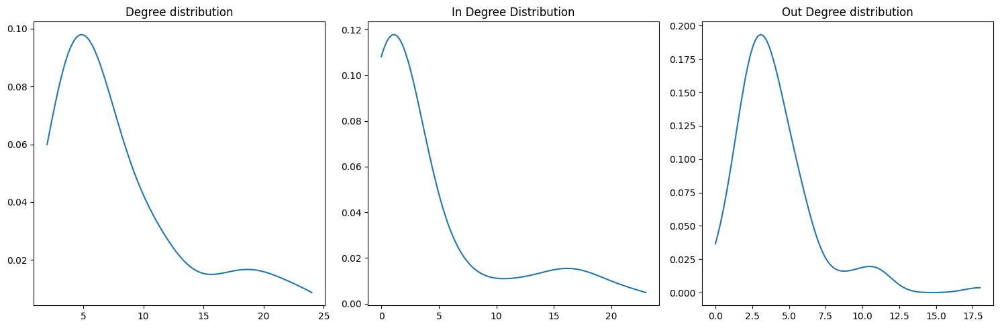

Top 3 nodes by degree: ['52', '81', '59'] (Degrees: [24, 24, 23])
Top 3 nodes by betweenness: ['59', '10', '93'] (Betweenness: [322.41666666666674, 189.83333333333334, 189.33333333333334])
Top 3 nodes by Clustering Coefficient: ['26', '29', '32'] (Betweenness: [1.0, 1.0, 1.0])


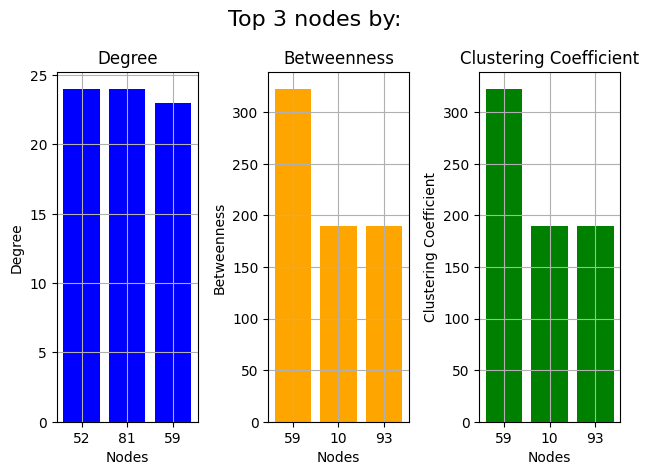

In [22]:
network_graph.create_graph_for_analysis()

In [163]:
# Runtime +-2m33s
generate_video(directory, videoname)

Time to load 96 images: 0.55 seconds
Time to create animation: 0.75 seconds
Time to save animation: 151.60 seconds
Video has been created and saved as 'graph_animation.mp4'.


In [ ]:
directory = "betweenness_failed_transactions" # Directory to save frames
title = "betweenness" # Title of the frames
videoname = "betweenness"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.betweenness_cumulative() # Create the network and save the frames

In [ ]:
Video(f'{videoname}.mp4', embed=True, width=1920, height=1080)

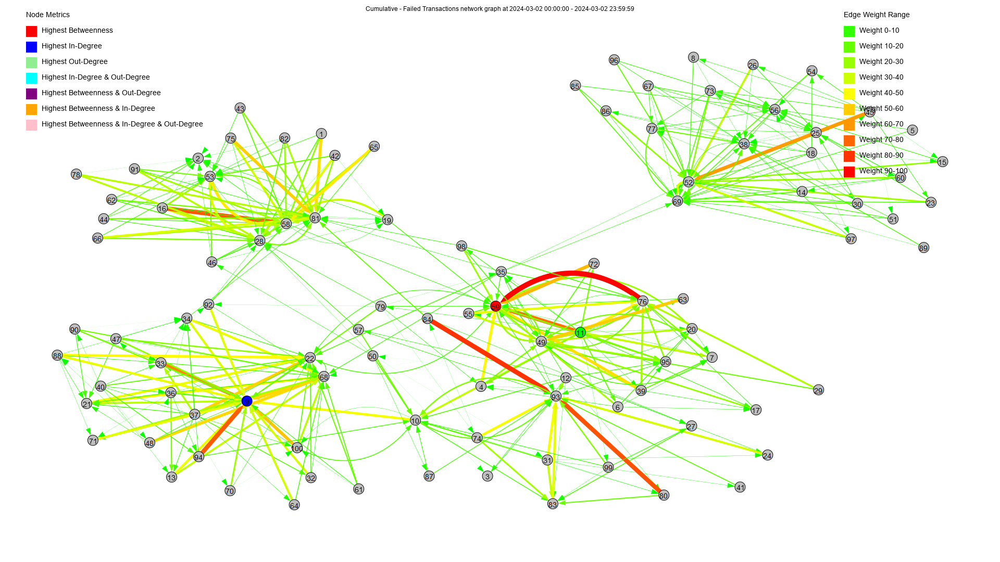

In [165]:
network_graph.create_final_image_cumulative()

*uitleg*: Stervorming!, steeds dezelfde die failen

## Case: Participant 35 frozen

In this scenario, participant 35 is frozen starting at 5 a.m. Freezing, a function of the simulator, prevents this participant from engaging in the security settlement process. In the base case, participant 35 is the node with the highest betweenness centrality, in-degree, and out-degree. This participant plays a crucial role in connecting various clusters within the network.

In [23]:
#read in eventlog
eventlog = pd.read_csv('.\DATA\eventlog_35_5h00.csv', sep=';')
#join transactions with event log
network_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df = network_df[network_df['Activity'] == "Settling"].copy()

<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\toont\AppData\Local\Temp\ipykernel_6264\1704507957.py:2: SyntaxWarning: invalid escape sequence '\D'
  eventlog = pd.read_csv('.\DATA\eventlog_35_5h00.csv', sep=';')


### Cumulative Network Analysis Over Time

In [24]:
# Runtime +-1m21s
directory = "35_Case_freeze__cumulative_video" # Directory to save frames
title = "Cumulative - Settled Transactions" # Title of the frames
videoname = "35_Freeze_Cumulative-SettledTransactions"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.create_graphs_cumulative() # Create the network and save the frames

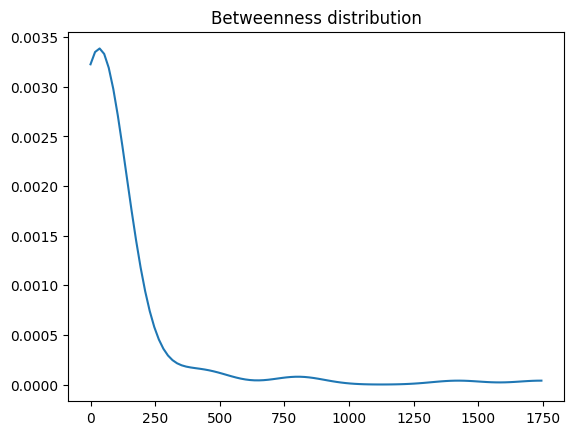

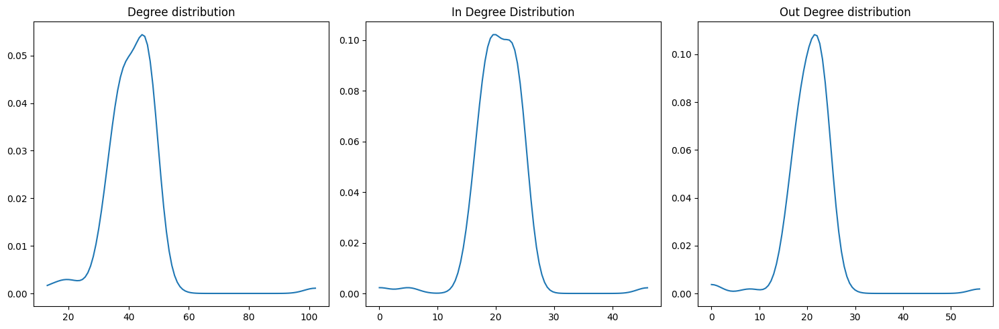

Top 3 nodes by degree: ['79', '92', '36'] (Degrees: [102, 53, 49])
Top 3 nodes by betweenness: ['35', '79', '38'] (Betweenness: [1743.5944649098283, 1419.8016979950585, 803.2272727272726])
Top 3 nodes by Clustering Coefficient: ['14', '15', '18'] (Betweenness: [1.0, 1.0, 1.0])


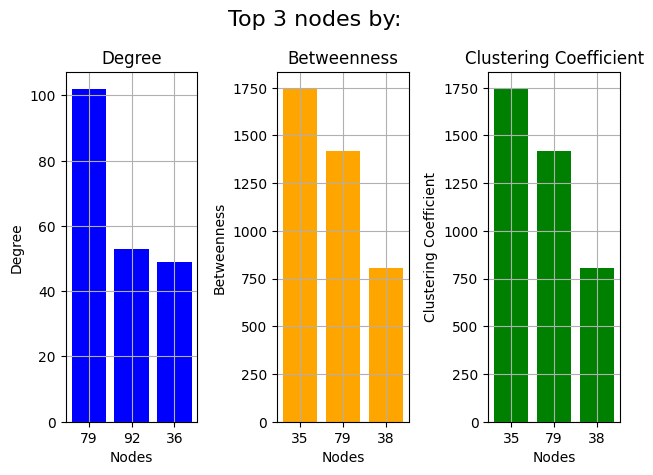

In [25]:
network_graph.create_graph_for_analysis()

In [18]:
# Runtime +-2m30s
generate_video(directory, videoname)

Time to load 96 images: 0.98 seconds
Time to create animation: 0.77 seconds
Time to save animation: 132.41 seconds
Video has been created and saved as '35_Freeze_Cumulative-SettledTransactions.mp4'.


In [ ]:
directory = "betweenness_35_frozen" # Directory to save frames
title = "betweenness" # Title of the frames
videoname = "betweenness"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.betweenness_cumulative() # Create the network and save the frames

In [ ]:
Video(f'{videoname}.mp4', embed=True, width=1920, height=1080)

In the video, it can be observed that between the start at midnight and 5 a.m., there is significant activity within the various clusters of financial institutions. Consequently, the nodes with the highest degree are located within these clusters. During this time, node 35 is still active in its connecting role, which is why it has the highest betweenness centrality.

From 5 a.m., when node 35 is prevented from participating, we observe that the clusters develop more independently, with the highest activity occurring within these separate groups. The increasing importance of node 79 in connecting the southern clusters, serving as an alternative to node 35, is also notable. The video concludes with three visually distinct blocks of financial institutions that are strongly interconnected internally.

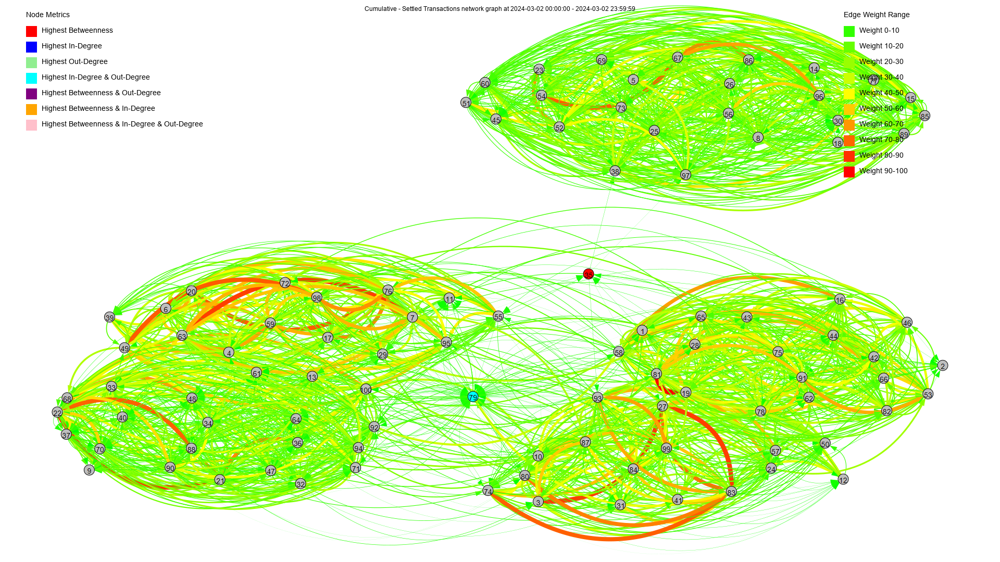

In [20]:
network_graph.create_final_image_cumulative()

From the final state of the cumulative network with participant 35 frozen, several notable observations can be made.

In terms of the network's global characteristics, participant 35 no longer holds the highest in-degree and out-degree, though it still has the highest betweenness centrality. With participant 35 frozen, bank 79 emerges as a key connector within the financial system, forming numerous relationships with other banks, as indicated by its highest in-degree and out-degree.

Another significant point is the role of node 35, which appears to be the sole connector of an "offshore" cluster of banks to the rest of the network. This creates a high systemic risk due to node 35 being a single point of failure. If node 35 were to fail unexpectedly, it could lead to a liquidity shortage in the markets, potentially causing severe consequences.

Finally, applying community detection to this final state of the network could yield interesting insights. Visually comparing this state to the base case suggests that the number of distinguishable clusters has decreased from five to three. It will be interesting to see how community detection algorithms interpret these changes.



## Case: Participant 79 frozen

In this scenario, node 79 is frozen starting at 5 a.m. In the base case, node 79, along with participant 35, plays a crucial role in connecting the clusters. However, node 79 has a lower betweenness centrality and degree compared to participant 35 in the base case. 

In [24]:
#read in eventlog
eventlog = pd.read_csv('.\DATA\eventlog_79_5h00.csv', sep=';')
#join transactions with event log
network_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df = network_df[network_df['Activity'] == "Settling"].copy()

<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\toont\AppData\Local\Temp\ipykernel_13240\1023846435.py:2: SyntaxWarning: invalid escape sequence '\D'
  eventlog = pd.read_csv('.\DATA\eventlog_79_5h00.csv', sep=';')


### Cumulative Network Analysis Over Time

In [25]:
# Runtime +-1m23s
directory = "79_Case_freeze__cumulative_video" # Directory to save frames
title = "Cumulative - Settled Transactions" # Title of the frames
videoname = "79_Freeze_Cumulative-SettledTransactions"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.create_graphs_cumulative() # Create the network and save the frames

In [ ]:
network_graph.create_graph_for_analysis()

In [26]:
# Runtime +-2m30s
generate_video(directory, videoname)

Time to load 96 images: 1.15 seconds
Time to create animation: 0.88 seconds
Time to save animation: 145.24 seconds
Video has been created and saved as '79_Freeze_Cumulative-SettledTransactions.mp4'.


In [ ]:
directory = "betweenness_79_frozen" # Directory to save frames
title = "betweenness" # Title of the frames
videoname = "betweenness"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.betweenness_cumulative() # Create the network and save the frames

In [ ]:
Video(f'{videoname}.mp4', embed=True, width=1920, height=1080)


From the video, it can be seen that there is a lot of transaction activity within the clusters from the beginning, although there are also many transactions between clusters. The role of node 79 is already limited before freezing, while node 35 immediately takes on a connecting role with the highest betweenness.

After 5 a.m., we mainly notice that the clusters in the east become more intertwined, and then nodes 10 and 84 take on more transactions. Node 35 also becomes the most important node in terms of degree. The volume of transactions is highest in the clusters in the east.

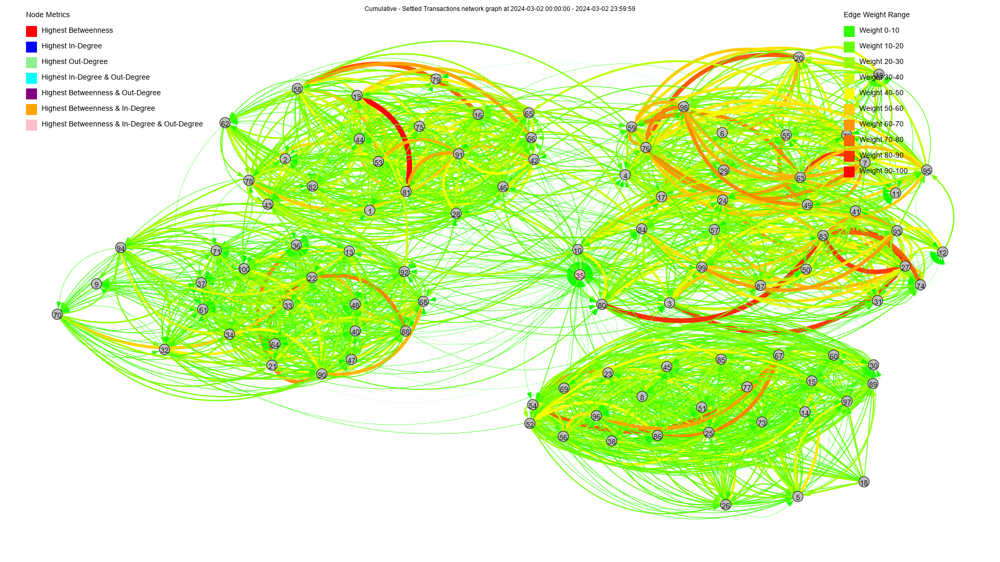

In [27]:
network_graph.create_final_image_cumulative()

By freezing participant 79, we first notice that this node no longer plays a central role in the network. It shifts from acting as a hub/bridge between clusters of banks in the base case to being just one of the participants in the northwestern cluster.

We also observe that participant 35's connecting role becomes even more significant, while some of the bridging responsibilities are taken over by banks 84 and 10.

This network could serve as an example of how banks conduct transactions on a global scale. Visually, different clusters can be distinguished, with many transactions occurring within these clusters. However, there are also two major blocks of clusters: one consisting of Western countries with many intertransactions, and the other of Eastern countries. A few banks act as hubs between these major blocks with a strong intercontinental focus. There is no immediate single point of failure since the connecting role is distributed among nodes 10, 35, and 84, with several other banks also taking the initiative to engage in intercontinental transactions.


## Community detection


add short introduction about the goal of this section

### Community detection on the base case

In [29]:
# df hier terug opnieuw inladen
#read in eventlog
eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')
#join transactions with event log
network_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df = network_df[network_df['Activity'] == "Settling"].copy()

<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:3: SyntaxWarning: invalid escape sequence '\D'
C:\Users\toont\AppData\Local\Temp\ipykernel_13240\3304479012.py:3: SyntaxWarning: invalid escape sequence '\D'
  eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')


### Network statistics of the base case final-state network

In [ ]:
## show the network here

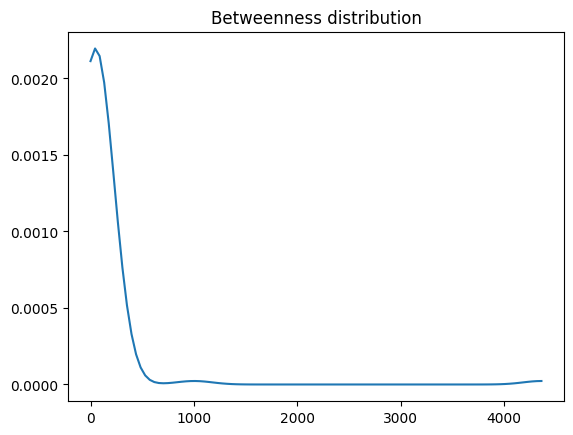

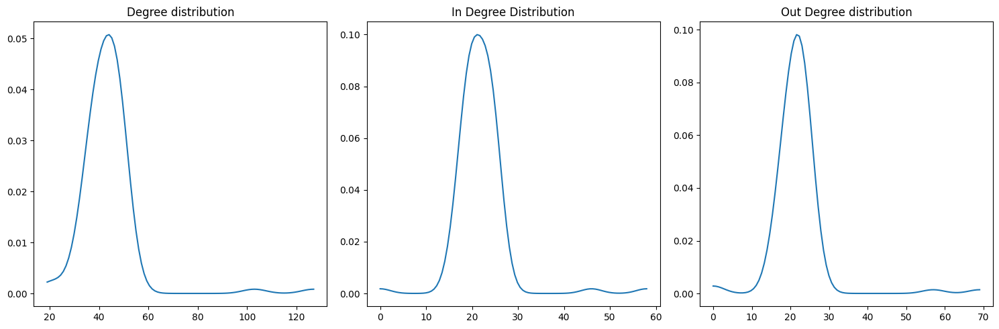

Top 3 nodes by degree: ['35', '79', '92'] (Degrees: [127, 103, 54])
Top 3 nodes by betweenness: ['35', '79', '92'] (Betweenness: [4360.540100698159, 1002.2863795234779, 112.45574690697588])
Top 3 nodes by Clustering Coefficient: ['18', '26', '5'] (Betweenness: [1.0, 1.0, 1.0])


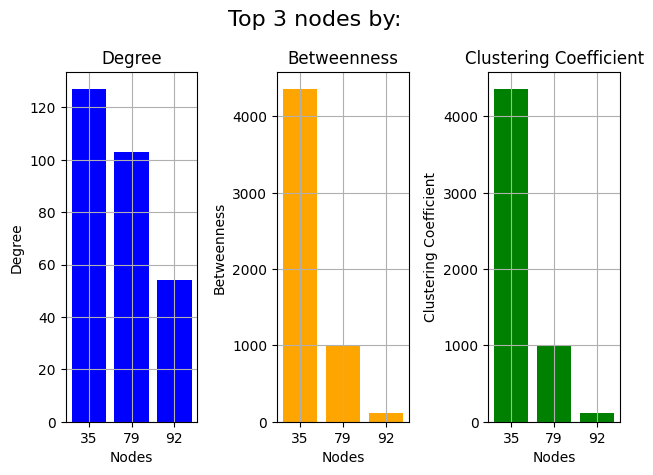

In [14]:
from IPython.display import Image, display

#load the graph (cumulative) to be analysed
directory = "Statistics"
title = "Statistics"

def create_graph_for_analysis(self):
    current_time = self.start_day
    next_time = self.end_day

    minute_df = self.filter_dataframe(current_time, next_time)

    g = ig.Graph(directed=True)
    g.add_vertices(self.all_participants)
    g.vs['name'] = self.all_participants

    if not minute_df.empty:
        transaction_sums = self.calculate_transaction_sums(minute_df)
        self.add_edges_to_graph(g, transaction_sums)
        weights = np.array(g.es["weight"])
        normalized_weights = self.normalize_weights(weights)
        norm = mcolors.Normalize(vmin=0, vmax=100)
        edge_colors_by_weight = [mcolors.to_hex(self.custom_cmap(norm(weight))) for weight in normalized_weights]
        node_colors = self.get_node_colors(g)
    else:
        node_colors = ["grey"] * len(g.vs)
        normalized_weights = []
        edge_colors_by_weight = []

    show_betw_distribution(self,g)    
    show_degree_distribution(self,g)
  
    show_top_3(self,g)

def show_degree_distribution(self, graph):
    # Create a figure and subplots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

    # Plot 1: Degree distribution
    degree=graph.degree()
    kde = gaussian_kde(degree)
    dist_space = np.linspace( min(degree), max(degree), 100 )
    axes[0].plot(dist_space, kde(dist_space))
    axes[0].set_title("Degree distribution")

    # Plot 2: In degree distribution
    in_degree=graph.indegree()
    kde = gaussian_kde(in_degree)
    dist_space = np.linspace( min(in_degree), max(in_degree), 100 )
    axes[1].plot(dist_space, kde(dist_space))
    axes[1].set_title("In Degree Distribution")

    # Plot 3: Out Degree distribution
    out_degree=graph.outdegree()
    kde = gaussian_kde(out_degree)
    dist_space = np.linspace( min(out_degree), max(out_degree), 100 )
    axes[2].plot(dist_space, kde(dist_space))
    axes[2].set_title("Out Degree distribution")

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()

def show_betw_distribution(self,graph):
    # Estimation of the probability denstity function using a kernel-density estimation using Gaussian kernel
    btw=graph.betweenness()
    kde = gaussian_kde(btw)
    # these are the values over wich your kernel will be evaluated
    dist_space = np.linspace( min(btw), max(btw), 100 )
    # plot the results
    plt.plot( dist_space, kde(dist_space) )
    plt.title("Betweenness distribution")

def show_top_3(self, graph):
    # Calculate degrees and betweenness centrality for all nodes
    degree = graph.degree()
    betweenness = graph.betweenness()
    clustering_coeff=graph.transitivity_local_undirected()

    # Get the top 3 nodes by degree
    top3_degree_nodes = sorted(range(len(degree)), key=lambda i: degree[i], reverse=True)[:3]
    top3_degree_values = [degree[i] for i in top3_degree_nodes]
    top3_degree_labels = [graph.vs[i]["name"] for i in top3_degree_nodes]

    # Get the top 3 nodes by betweenness
    top3_betweenness_nodes = sorted(range(len(betweenness)), key=lambda i: betweenness[i], reverse=True)[:3]
    top3_betweenness_values = [betweenness[i] for i in top3_betweenness_nodes]
    top3_betweenness_labels = [graph.vs[i]["name"] for i in top3_betweenness_nodes]

    # Get the top 3 nodes by betweenness
    top3_clustering_nodes = sorted(range(len(clustering_coeff)), key=lambda i: clustering_coeff[i], reverse=True)[:3]
    top3_clustering_values = [clustering_coeff[i] for i in top3_clustering_nodes]
    top3_clustering_labels = [graph.vs[i]["name"] for i in top3_clustering_nodes]

    print(f"Top 3 nodes by degree: {top3_degree_labels} (Degrees: {top3_degree_values})")
    print(f"Top 3 nodes by betweenness: {top3_betweenness_labels} (Betweenness: {top3_betweenness_values})")
    print(f"Top 3 nodes by Clustering Coefficient: {top3_clustering_labels} (Betweenness: {top3_clustering_values})")

    # Plot for top 3 nodes by degree
    plt.subplot(1, 3, 1)
    plt.bar(top3_degree_labels, top3_degree_values, color='blue')
    plt.title('Degree')
    plt.xlabel('Nodes')
    plt.ylabel('Degree')
    plt.grid(True)

    # Plot for top 3 nodes by betweenness
    plt.subplot(1, 3, 2)
    plt.bar(top3_betweenness_labels, top3_betweenness_values, color='orange')
    plt.title('Betweenness')
    plt.xlabel('Nodes')
    plt.ylabel('Betweenness')
    plt.grid(True)

    # Plot for top 3 nodes by clustering coefficient
    plt.subplot(1, 3, 3)
    plt.bar(top3_betweenness_labels, top3_betweenness_values, color='green')
    plt.title('Clustering Coefficient')
    plt.xlabel('Nodes')
    plt.ylabel('Clustering Coefficient')
    plt.grid(True)

    # Save and show the plots
    plt.suptitle('Top 3 nodes by:', fontsize=16)

    plt.tight_layout()
    plt.savefig('top_nodes_statistics.png')
    plt.show()
    
NetworkGraph.create_graph_for_analysis = create_graph_for_analysis
NetworkGraph.show_degree_distribution = show_degree_distribution
NetworkGraph.show_betw_distribution = show_betw_distribution
NetworkGraph.show_top_3 = show_top_3


network_graph = NetworkGraph(df, directory,"top","top", title)
network_graph.create_graph_for_analysis()


### Community detection algorithms on the base case

C:\Users\toont\AppData\Local\Temp\ipykernel_13240\2509508696.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', num_communities)


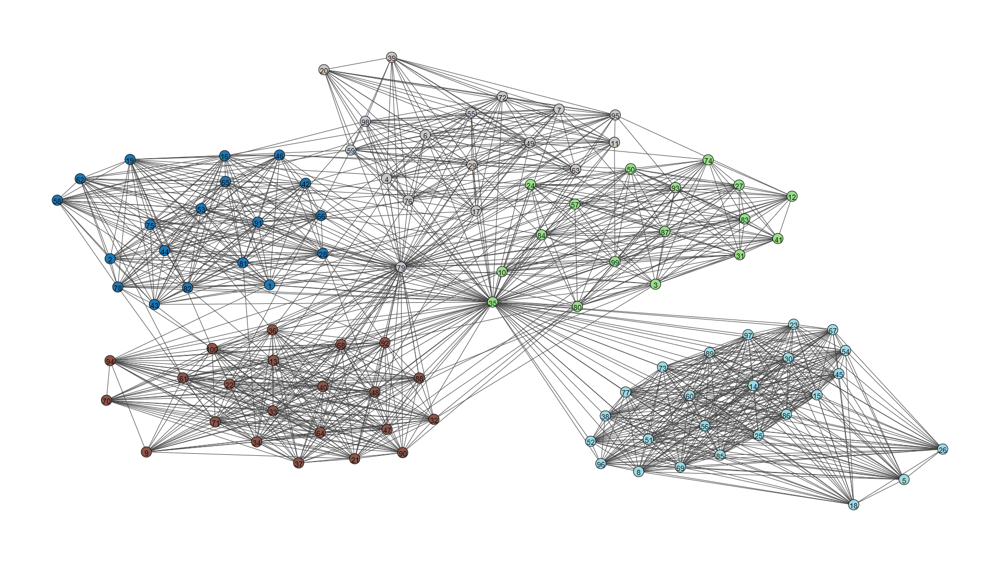

In [30]:
from IPython.display import Image, display

#load the graph (cumulative) to be analysed
directory = "image"
title = "Community detection multilevel"

def generate_community_colors(self, partition):
    num_communities = len(set(partition.membership))
    colors = plt.cm.get_cmap('tab20', num_communities)
    return [mcolors.to_hex(colors(i)) for i in range(num_communities)]

def save_graph_with_communities(self):
    current_time = self.start_day
    next_time = self.end_day

    minute_df = self.filter_dataframe(current_time, next_time)

    g = ig.Graph(directed=True)
    g.add_vertices(self.all_participants)
    g.vs['name'] = self.all_participants

    if not minute_df.empty:
        transaction_sums = self.calculate_transaction_sums(minute_df)
        self.add_edges_to_graph(g, transaction_sums)
        weights = np.array(g.es["weight"])
        normalized_weights = self.normalize_weights(weights)
        norm = mcolors.Normalize(vmin=0, vmax=100)
        edge_colors_by_weight = [mcolors.to_hex(self.custom_cmap(norm(weight))) for weight in normalized_weights]
        node_colors = self.get_node_colors(g)
    else:
        node_colors = ["grey"] * len(g.vs)
        normalized_weights = []
        edge_colors_by_weight = []

    g = g.as_undirected(combine_edges='sum')

    partition = g.community_multilevel()
    community_colors = self.generate_community_colors(partition)

    # Assigning colors to vertices based on their community membership
    for vertex in g.vs:
        vertex['color'] = community_colors[partition.membership[vertex.index]]

    visual_style = {
        'vertex_size': 20,
        'vertex_color': g.vs['color'],
        'vertex_label': g.vs['name'],
        'layout': self.fixed_layout,  # Assuming a layout is defined
        'bbox': (1920, 1080),
        'margin': 110
    }

    # Save the plot to a file
    file_name = f"{self.directory}/community_multilevel.png"
    ig.plot(g, target=file_name, **visual_style)
    self.add_title_and_legend(file_name, current_time, next_time, False)

    # Display the plot inline in the notebook
    display(Image(filename=file_name))

NetworkGraph.generate_community_colors = generate_community_colors
NetworkGraph.save_graph_with_communities = save_graph_with_communities


network_graph = NetworkGraph(df, directory,"top","top", title)
network_graph.create
network_graph.save_graph_with_communities()

## Relationship between Settlement Efficiency and Betweenness

In [ ]:
def settlement_efficiency_betweenness():
    settlement_efficiency_df = pd.read_csv('testfiles\SE_per_participant_day_1.csv', sep=';')
    print(settlement_efficiency_df)
    nodes=g.vs["name"]
    print(g.betweenness())
    se={}
    bt={}
    for node in nodes:
        betweenness_node=g.betweenness(vertices=node)
        settlement_efficiency = settlement_efficiency_df["settled_input_ratio"][settlement_efficiency_df["FromParticipantId"]==int(node)].values[0]
        se[node] = settlement_efficiency
        print("node: ", node, ", betweenness: ",g.betweenness(vertices=node), ", Settlement efficiency: ", settlement_efficiency)
        se[node]=settlement_efficiency
        bt[node]=betweenness_node
    print(se)
    print(bt)

    nodes = se.keys()
    x_data = [se[node] for node in nodes]
    y_data = [bt[node] for node in nodes]

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.scatter(x_data, y_data)
    # Adding labels for each point
    for i, node in enumerate(nodes):
        plt.text(x_data[i], y_data[i], str(node))
    slope, intercept = np.polyfit(x_data, y_data, 1)
    trendline_x = np.linspace(min(x_data), max(x_data), 100)
    trendline_y = slope * trendline_x + intercept
    plt.plot(trendline_x, trendline_y, color='red', linestyle='--', label=f'Trendline: y={slope:.2f}x+{intercept:.2f}')

    # Adding labels and title
    plt.xlabel('Efficiency')
    plt.ylabel('Betweenness')
    plt.title('Efficiency vs Betweenness for Nodes')

    # Display the plot
    plt.grid(True)
    plt.show()

    return
settlement_efficiency_betweenness()

## Conclusion and Future Work


Based on this temporal network analysis, it can be concluded that the cumulative security settlement network features highly concentrated clusters of transactions between nodes, which may correspond to different markets or geographic regions. The skewed distribution of betweenness centrality indicates a significant variation in node centrality, with certain nodes serving as key hubs or bridges between clusters. 

When these critical nodes are immobilized during the settlement process, the network's structure changes (e.g., multiple clusters merging into fewer clusters), and other financial institutions start to play important roles within the network. This highlights the importance of avoiding single points of failure to reduce systemic risk in banking. 

From community detection, it can be concluded that.... 

Potential future research in this context includes using event log data over several days and gaining deeper insights into participants' account balances at any given time. Furthermore, it could be interesting to enable the values of edges to be adjusted dynamically, for example, when a failed settlement is eventually successful through recycling. 

Other interesting options for investigation include adding additional variables (such as geographic location, balance size, and share type) to the nodes. Additionally, conducting link prediction to forecast potential future transactions between 2 participants could help to adjust security availability accordingly and increase the settlement efficiency. 

## Individual Contribution and Gained Knowledge

The key learning points of this project for us were applying analysis methods to social networks, which added an engaging extra dimension to our thesis. The most significant challenge we faced was temporal graph analysis, where we needed to determine how to visualize the network over time. 

Other learning experiences included extensive object-oriented programming with various data types, including functions, images, and videos. We also made extensive use of the igraph package. 

Lastly, we translated our analyses into clear and concrete insights for the reader, both visually and in words. 

### Victor

### Toon